# Mask R-CNN inference on fire images

based on of Mask R-CNN Instance Segmentation Demo from tensorflow

# Instructions
<h3><a href="https://cloud.google.com/tpu/"><img valign="middle" src="https://raw.githubusercontent.com/GoogleCloudPlatform/tensorflow-without-a-phd/master/tensorflow-rl-pong/images/tpu-hexagon.png" width="50"></a>  &nbsp;&nbsp;Use a free Cloud TPU</h3>
 
   1. On the main menu, click Runtime and select **Change runtime type**. Set "TPU" as the hardware accelerator.
   2. Click Runtime again and select **Runtime > Run All**. You can also run the cells manually with Shift-ENTER.

## Download the source code
Download the source code of the Mask R-CNN model.

In [1]:
!git clone https://github.com/tensorflow/tpu/

fatal: destination path 'tpu' already exists and is not an empty directory.


## Import libraries

In [0]:
from IPython import display
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import sys
sys.path.insert(0, 'tpu/models/official')
sys.path.insert(0, 'tpu/models/official/mask_rcnn')
import coco_metric
from mask_rcnn.object_detection import visualization_utils

## Load the COCO index mapping
This Colab uses a pretrained checkpoint of the Mask R-CNN model that is trained using the COCO dataset. Here is the mapping between the indices that the model predicts and the categories in text.

In [0]:
ID_MAPPING = {
    1: 'person',
    2: 'bicycle',
    3: 'car',
    4: 'motorcycle',
    5: 'airplane',
    6: 'bus',
    7: 'train',
    8: 'truck',
    9: 'boat',
    10: 'traffic light',
    11: 'fire hydrant',
    13: 'stop sign',
    14: 'parking meter',
    15: 'bench',
    16: 'bird',
    17: 'cat',
    18: 'dog',
    19: 'horse',
    20: 'sheep',
    21: 'cow',
    22: 'elephant',
    23: 'bear',
    24: 'zebra',
    25: 'giraffe',
    27: 'backpack',
    28: 'umbrella',
    31: 'handbag',
    32: 'tie',
    33: 'suitcase',
    34: 'frisbee',
    35: 'skis',
    36: 'snowboard',
    37: 'sports ball',
    38: 'kite',
    39: 'baseball bat',
    40: 'baseball glove',
    41: 'skateboard',
    42: 'surfboard',
    43: 'tennis racket',
    44: 'bottle',
    46: 'wine glass',
    47: 'cup',
    48: 'fork',
    49: 'knife',
    50: 'spoon',
    51: 'bowl',
    52: 'banana',
    53: 'apple',
    54: 'sandwich',
    55: 'orange',
    56: 'broccoli',
    57: 'carrot',
    58: 'hot dog',
    59: 'pizza',
    60: 'donut',
    61: 'cake',
    62: 'chair',
    63: 'couch',
    64: 'potted plant',
    65: 'bed',
    67: 'dining table',
    70: 'toilet',
    72: 'tv',
    73: 'laptop',
    74: 'mouse',
    75: 'remote',
    76: 'keyboard',
    77: 'cell phone',
    78: 'microwave',
    79: 'oven',
    80: 'toaster',
    81: 'sink',
    82: 'refrigerator',
    84: 'book',
    85: 'clock',
    86: 'vase',
    87: 'scissors',
    88: 'teddy bear',
    89: 'hair drier',
    90: 'toothbrush',
}
category_index = {k: {'id': k, 'name': ID_MAPPING[k]} for k in ID_MAPPING}

##Mount google drive 

In [4]:
from google.colab import drive
import os
drive.mount('/content/gdrive')
IMAGE_DIR = '/content/gdrive/My Drive/FireVideo/dry_creek/'
image_paths = [IMAGE_DIR+fname for fname in os.listdir(IMAGE_DIR)]

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
pil_images, np_images, np_image_strings = [], [], []

for image_path in image_paths:
  
  #open the image
  with open(image_path, 'rb') as f:
    np_image_strings.append(np.array([f.read()]))
    pil_images.append(Image.open(image_path))
    
    width, height = pil_images[-1].size
    np_images.append(np.array(pil_images[-1].getdata()).reshape(height, width, 3).astype(np.uint8))


#display.display(display.Image(image_path, width=1024))

%matplotlib inline
plt.imshow(pil_images[-1])
plt.show()

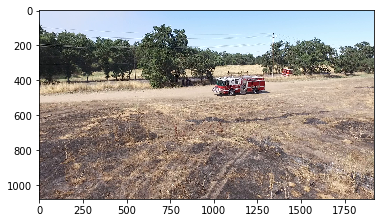

## Create a Tensorflow session
Now let us create a Tensorflow session to run the inference. You can either connect to a TPU or a normal CPU backend.

In [7]:
use_tpu = True #@param {type:"boolean"}
if use_tpu:
  import os
  import pprint

  assert 'COLAB_TPU_ADDR' in os.environ, 'ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!'
  TPU_ADDRESS = 'grpc://' + os.environ['COLAB_TPU_ADDR']
  print('TPU address is', TPU_ADDRESS)

  session = tf.Session(TPU_ADDRESS, graph=tf.Graph())
  print('TPU devices:')
  pprint.pprint(session.list_devices())
else:
  session = tf.Session(graph=tf.Graph())

TPU address is grpc://10.92.89.170:8470
TPU devices:
[_DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:CPU:0, CPU, -1, 14909636724826247630),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 4812498068179707887),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 14216251937036297454),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 7505820235034411035),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 16105161766229714350),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 15855581759139537635),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 14071958862529298198),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 61888717896941523),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 1267902401024

# Load the pretrained model
Loading the COCO pretrained saved model from the public GCS bucket. 

In [8]:
saved_model_dir = 'gs://cloud-tpu-checkpoints/mask-rcnn/1555659850' #@param {type:"string"}
_ = tf.saved_model.loader.load(session, ['serve'], saved_model_dir)

Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from gs://cloud-tpu-checkpoints/mask-rcnn/1555659850/variables/variables


## Perform instance segmentation and retrieve the predictions
Now let's run the inference and process the predictions from the model.


In [9]:
np_image_strings[0][0]

b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x07\x80\x00\x00\x048\x08\x02\x00\x00\x00g\xb1V\x14\x00\x00\x00\tpHYs\x00\x00\x00\x01\x00\x00\x00\x01\x00O%\xc4\xd6\x00\x00\x00 cHRM\x00\x00z&\x00\x00\x80\x84\x00\x00\xfa\x00\x00\x00\x80\xe8\x00\x00u0\x00\x00\xea`\x00\x00:\x98\x00\x00\x17p\x9c\xbaQ<\x00\x00\x00\x04gAMA\x00\x00\xc72\xc7IpD\x00\x00\x10\x00IDATx\x9c\xdc\xbd\x05w\\K\x9e\xe5\xdb_\xe7\xbd7\xd3\xddE\xf7\x9a\x85\x16\x83%\xcb\x96\xcc\xcc\x96\xc5\xccR\x8a\x99\x99\x999\xc5,YlKf\xfb2\xd7T\xf5T\xad\xf9\x06o\x9f\xb3\x95\x7f\x87\x8fl_\xdf\xee\xea7\xfdf\xad\xbdb\xfd#\x0e$(\x95\x19\xe7\x97;w\xfcS}\xe7\x00\xd5\xd8=d\x90:\xde\xdc;\xd2\xd27Ju\x0eOv\x8dL\xf5\x8e\xcd\x0e\xcf,C\xa3s\x0f\xa1\x91\xd9\x95\xb1\x855\x88]\x19\xc4\x0eC\xd3Kl\xd1\x85d\\\x15\xb6r7\xee\xc3\xee\xe0\xd4\xa2*\xc3 \xf7\xe7\x1d`\xc1c\xcd\xb8i\xbd\x1d\xc7\x9d\xc1\xc8\xcc2j\x0e\x8eZn\x97;\xf0\xde\xca\xddF\xcbC\xd0N-oN.\xadA\xd3+\x1b\xa2\x99\x87\x9bsk\xdbj\xd7 lE;\xbf\xfe\x08\x05\xc4ba\xe31\xb4\xb8\xb9\x03-m\xed.o?Y\xdb}\x01\xad?~\

In [0]:
results = []
for np_image_string in np_image_strings:

  num_detections, detection_boxes, detection_classes, detection_scores, \
  detection_masks, image_info = session.run(['NumDetections:0',
                                             'DetectionBoxes:0',
                                             'DetectionClasses:0',
                                             'DetectionScores:0',
                                             'DetectionMasks:0',
                                             'ImageInfo:0'],
                                            feed_dict={'Placeholder:0': np_image_string})
  
  result_dict = {}
  result_dict['num_detections'] = num_detections = np.squeeze(num_detections.astype(np.int32), axis=(0,))
  result_dict['detection_boxes'] = detection_boxes = np.squeeze(detection_boxes * image_info[0, 2], axis=(0,))[0:num_detections]
  result_dict['detection_scores'] = np.squeeze(detection_scores, axis=(0,))[0:num_detections]
  result_dict['detection_classes'] = np.squeeze(detection_classes.astype(np.int32), axis=(0,))[0:num_detections]
  result_dict['instance_masks'] = instance_masks = np.squeeze(detection_masks, axis=(0,))[0:num_detections]
  ymin, xmin, ymax, xmax = np.split(detection_boxes, 4, axis=-1)
  result_dict['processed_boxes'] = processed_boxes = np.concatenate([xmin, ymin, xmax - xmin, ymax - ymin], axis=-1)
  result_dict['segmentations'] = coco_metric.generate_segmentation_from_masks(instance_masks, processed_boxes, height, width)
  
  results.append(result_dict)

## Visualize the detection results
Time to check out the result!

In [0]:
try:
  os.mkdir(IMAGE_DIR+'/results/')
except FileExistsError:
  pass

In [0]:
for idx, result in enumerate(results):
  num_detections = result['num_detections']
  detection_boxes = result['detection_boxes']
  detection_scores = result['detection_scores']
  detection_classes = result['detection_classes']
  instance_masks = result['instance_masks']
  processed_boxes = result['processed_boxes']
  segmentations = result['segmentations']


  max_boxes_to_draw = 50   #@param {type:"integer"}
  min_score_thresh = 0.7    #@param {type:"slider", min:0, max:1, step:0.01}

  image_with_detections = visualization_utils.visualize_boxes_and_labels_on_image_array(
      np_images[idx],
      detection_boxes,
      detection_classes,
      detection_scores,
      category_index,
      instance_masks=segmentations,
      use_normalized_coordinates=False,
      max_boxes_to_draw=max_boxes_to_draw,
      min_score_thresh=min_score_thresh)
  
  out_pil_image = Image.fromarray(image_with_detections.astype(np.uint8))
  out_pil_image.save(IMAGE_DIR+'/results/result{}.png'.format(idx))